# Lab Assignment Two: Exploring Image Data

***Sahil Johari, Prabhat Pal, Pritheesh Panchmahalkar, Azeem Merchant***
<hr>

## 1. Business Understanding

### 1.1 Overview of the Dataset

The dataset consists of over 8000 high-resolution colored images of retinas from various patients. The images are a mix of left and right eye images which each one being labeled with the patient ID as well as whether it is an image of the right or left eye.
The images in the dataset are from a variety of different cameras and lenses, which affect the appearance of left and right. Some images are inverted whereas some images are naturally oriented. 

Each image in the training dataset is also rated by a clinician on the following scale:
   * 0 – No Diabetic Retinopathy
   * 1 – Mild Diabetic Retinopathy
   * 2 – Moderate Diabetic Retinopathy
   * 3 – Severe Diabetic Retinopathy
   * 4 – Proliferative Diabetic Retinopathy
   
The macula (small central dark area) on the left and the optic nerve on the right means that this is a non-inverted image of a right eye. 
There are two ways to figure out if the image is inverted or not:
   * It is inverted if the macula is slightly higher than the midline through the optic nerve.
   * If there is a notch on the side of the image (square, triangle, or circle) then it's not inverted.

### 1.2 Purpose of the dataset and reason for its collection

This dataset was collected from patients as part of a screening test for Diabetic Retinopathy.

In current times, detecting Diabetic Retinopathy is a manual and time consuming process which involves trained clinician to examine and evaluate digital photographs of the retina. This leads to delayed results. The purpose of this dataset is to provide an automated and easy alternative method to screen for Diabetic Retinopathy. Since this method will be automated, it will be much faster and cost effective for an initial screen. The clinician can then spend their valuable time only on the sample which the computer detected as positive. 


### 1.3 Prediction task for dataset

In this assignment, we are going to attempt reconstruction and feature extraction from the images in the dataset. Our goal is to predict different classes of Diabetic Retinopathy for any image that is chosen from the dataset using a set of techniques to reconstruct and extract features from them.

In the original manual method, the clinician goes through the digital images and rates each one of them on a scale of 0 to 4. 0 meaning there are no signs of Diabetic Retinopathy in the patient and 4 meaning there is proliferative Diabetic Retinopathy present.

Our task is to predict this rating from 0 to 4 in the testing dataset.

### 1.4 Importance of data

Diabetic Retinopathy is the leading cause of blindness in the working-age population of the developed world and it is estimated to affect over 93 million people.

There has always been a need for a comprehensive and automated method for Diabetic Retinopathy screening. The data gives us more insight into the symptoms of the condition and about how it can be diagnosed using automated machine learning methods. If a method which is robust against noise and irregularities in the images such as issues with the focus and exposure is found, a breakthrough will be made in affecting the lives of patients and doctors as well. 

### 1.5 Performance constraints of modeling algorithm

If the machine learning algorithm is performing as expected, it should provide accurate results even if the images are out of focus, underexposed, overexposed or full of noise. As these are real life problems, they are expected to be present in any type of image data that is collected for testing purposes.

In this assignment, we will be using a dataset which contains a large number of images (over 8000) of the eyes of various patients with  diabetic retinopathy to perform preprocessing operations and exploratory analysis on it.

Diabetic retinopathy is a medical condition in which the retina is damaged because of diabetes, causing blindness. Diabetic retinopathy has been a major cause of blindness specifically in the younger population of over 93 million. At present, Diabetic retinopathy detection is a time-consuming and manual process. It requires skilled clinician to examine and analyse the retina images, which leads to delayed results. By making use of processes such as image classification, pattern recognition, and machine learning, the Diabetic retinopathy screening process can be automated, which serves as the prediction task for this dataset. Furthermore, it can be further pushed to it's limits resulting in models with realistic clinical potential. 

In this assignment, we are going to attempt reconstruction and feature extraction from the images in the dataset. Our goal is to predict different classes of Diabetic retinopathy for any image that is chosen from the dataset using a set of techniques to reconstruct and extract features from them.

## 2. Data Preparation

### 2.1 Reading and Preprocessing the Images 

In [ ]:
import glob
import numpy as np
from PIL import Image
import random

preprocessing = False

if preprocessing:
    files = glob.glob("train/*")[:100]
    size = int(4752*0.25), int(3168*0.25)

    for i in files:
        im = Image.open(i)
        im_resized = im.resize(size, Image.ANTIALIAS)
        dest = 'dest/'+i.split("/")[1]
        im_resized.save(dest, "JPEG")

In [43]:
import matplotlib.image as mpimg
import glob

files = glob.glob("dest/*")[:50]

flattened = []
flattened_r = []
flattened_g = []
flattened_b = []
for i in files:
    np_image = mpimg.imread(i)
    np_image_r = []
    np_image_g = []
    np_image_b = []

    for i in np_image:
        for j in i:
            np_image_r.append(j[0])
            np_image_g.append(j[1])
            np_image_b.append(j[2])
    
    flattened.append(np_image.flatten())
    flattened_r.append(np_image_r)
    flattened_g.append(np_image_g)
    flattened_b.append(np_image_b)

h, w, c = mpimg.imread(files[0]).shape

In [44]:
import pandas as pd
import numpy as np
import re

X = np.array(flattened)
X_r = np.array(flattened_r)
X_g = np.array(flattened_g)
X_b = np.array(flattened_b)

n_samples, n_features = X.shape 
names = [re.split('[\\\.]', i)[1] for i in files]
df = pd.read_csv("trainLabels.csv")
y = []
for i in names:
    y.append(df.loc[df['image'] == i, 'level'].item())
print(h*w*3)
n_classes = len(set(y))
# n_samples = 1000
# n_features = 

print(np.sum(~np.isfinite(X).all()))
print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print("Original Image Sizes {} by {}".format(h,w))

2822688
0
n_samples: 50
n_features: 2822688
n_classes: 5
Original Image Sizes 792 by 1188


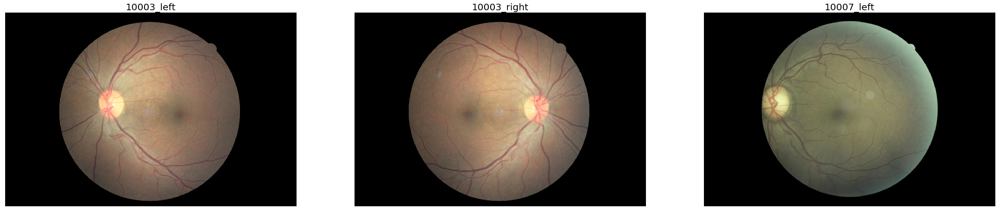

In [46]:
# a helper plotting function
%matplotlib inline
from matplotlib import pyplot as plt


def plot_gallery(images, titles, h, w, n_row=1, n_col=3):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(10 * n_col, 10 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape(h, w, c), cmap=plt.cm.gray)
        plt.title(titles[i], size=20)
        plt.xticks(())
        plt.yticks(())

plot_gallery(X[:3], names, h, w) # defaults to showing a 3 by 6 subset of the faces

In [47]:
# a helper plotting function
%matplotlib inline
from matplotlib import pyplot as plt

def plot_gallery_RGB(images, titles, h, w, cmap, n_row=1, n_col=3):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(10 * n_col, 10 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape(h, w),cmap=cmap)
        plt.title(titles[i], size=20)
        plt.xticks(())
        plt.yticks(())

In [48]:
from sklearn.decomposition import PCA

n_components = 10
print ("Extracting the top %d eigenretinas from %d retinas" % (
    n_components, X_b.shape[0]))

pca_r = PCA(n_components=n_components, svd_solver='full')
%time pca_r.fit(X_r.copy())
eigenRetinas_r = pca_r.components_.reshape(n_components, h, w)

pca_g = PCA(n_components=n_components, svd_solver='full')
%time pca_g.fit(X_g.copy())
eigenRetinas_g = pca_g.components_.reshape(n_components, h, w)

pca_b = PCA(n_components=n_components, svd_solver='full')
%time pca_b.fit(X_b.copy())
eigenRetinas_b = pca_b.components_.reshape(n_components, h, w)

Extracting the top 10 eigenretinas from 50 retinas
Wall time: 10.8 s
Wall time: 7.13 s
Wall time: 7.04 s


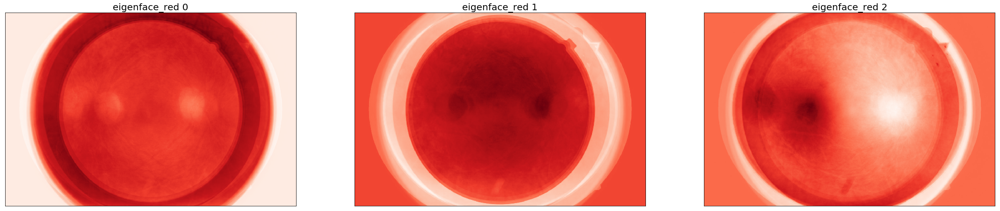

In [49]:
eigenRetinas_titles_r = ["eigenface_red %d" % i for i in range(eigenRetinas_r.shape[0])]
plot_gallery_RGB(eigenRetinas_r[:3], eigenRetinas_titles_r, h, w, cmap=plt.cm.Reds)

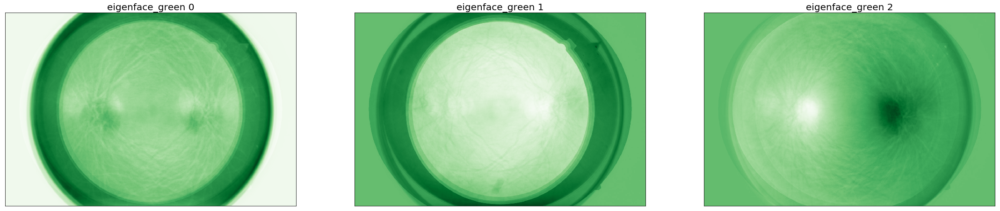

In [50]:
eigenRetinas_titles_g = ["eigenface_green %d" % i for i in range(eigenRetinas_g.shape[0])]
plot_gallery_RGB(eigenRetinas_g[:3], eigenRetinas_titles_g, h, w, cmap=plt.cm.Greens)

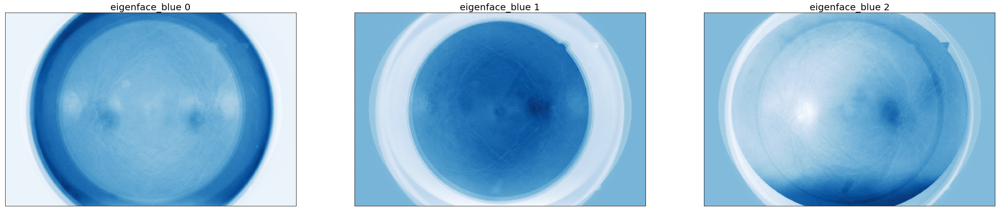

In [51]:
eigenRetinas_titles_b = ["eigenface_blue %d" % i for i in range(eigenRetinas_b.shape[0])]
plot_gallery_RGB(eigenRetinas_b[:3], eigenRetinas_titles_b, h, w, cmap=plt.cm.Blues)

_**Note**: Our initial attempt was to use color images in which we extracted 3 channels (R-G-B) and computed their principle components individually. However, after obtaining them we could not figure out a way to reconstruct the image using all the 3 principle components. Therefore, we have used grayscale images._

<hr>

We begin by preprocessing the images in our dataset by resizing them. As the dataset has high-quality images, we select 100 images to preprocess due to computational constraints of the systems being used. 

In [2]:
preprocessing = False

if preprocessing:
    files = glob.glob("train/*")[:100]
    size = int(4752*0.25), int(3168*0.25)

    for i in files:
        im = Image.open(i)
        im = im.convert(mode='L')
        im_resized = im.resize(size, Image.ANTIALIAS)
        dest = 'dest2/'+i.split("\\")[1]
        im_resized.save(dest, "JPEG")

### 2.2 Linearize the Images 

Once the images have been resized, they are linearized into 1-D image features by flatenning them.

In [53]:
import matplotlib.image as mpimg
import glob

files = glob.glob("dest2/*")

flattened = []
for i in files:
    np_image = mpimg.imread(i)
    flattened.append(np_image.flatten())


h, w = mpimg.imread(files[0]).shape

After the linearization, we read the attributes of the image array and print them.

In [54]:
import pandas as pd
import numpy as np
import re

X = np.array(flattened)
n_samples, n_features = X.shape 
names = [re.split('[\\\.]', i)[1] for i in files]
df = pd.read_csv("trainLabels.csv")
y = []
for i in names:
    y.append(df.loc[df['image'] == i, 'level'].item())

print(h*w)
n_classes = len(set(y))


print(np.sum(~np.isfinite(X)))
print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print("Original Image Sizes {} by {}".format(h,w))
print(X.shape)

940896
0
n_samples: 100
n_features: 940896
n_classes: 5
Original Image Sizes 792 by 1188
(100, 940896)


### 2.3 Visualize the Images

We use a helper function to plot the images. Time to take a look!

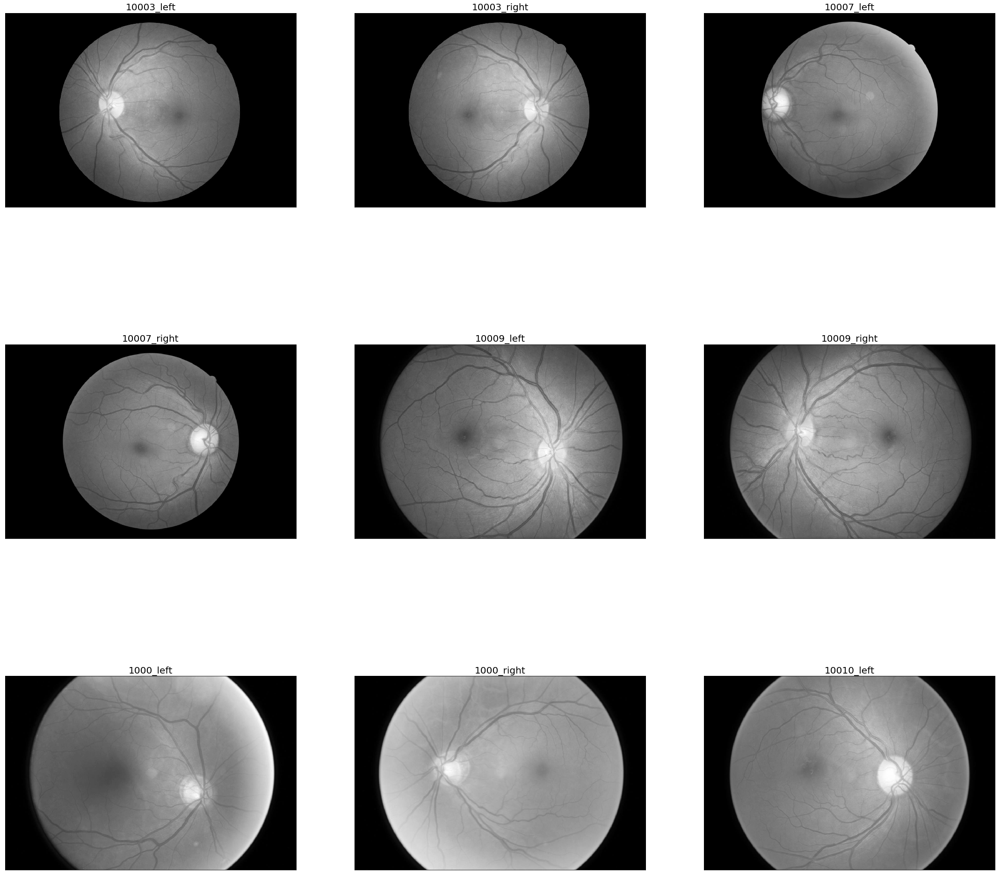

In [55]:
# a helper plotting function
%matplotlib inline
from matplotlib import pyplot as plt


def plot_gallery(images, titles, h, w, n_row=3, n_col=3):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(10 * n_col, 10 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=20)
        plt.xticks(())
        plt.yticks(())

plot_gallery(X[:9], names, h, w) # defaults to showing a 3 by 6 subset of the faces

## 3. Data Reduction

### 3.1 Linear Dimensionality Reduction : Principle Component Analysis

For dimensionality reduction, we have chosen 20 components after trying out a set of values.

In [56]:
from sklearn.decomposition import PCA

n_components = 20 # Delivers excellent accuracy with Kernal PCA, moderate with Randomized PCA.
# Full PCA is trash for our dataset!

print ("Extracting the top %d eigenretinas from %d retinas" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenRetinas = pca.components_.reshape(n_components, h, w)


rpca = PCA(n_components=n_components, svd_solver='randomized')
%time rpca.fit(X.copy())
eigenRetinas = rpca.components_.reshape(n_components, h, w)

Extracting the top 20 eigenretinas from 100 retinas
Wall time: 15.9 s
Wall time: 11.8 s


As you will see in the further sections, the output obtained for Kernel PCA was the best among all 3 PCA outputs.  We observed that, as we increased the number of components, the output for Kernel PCA improved drastically.

In [8]:
print(eigenRetinas.shape)
eigen = []
for i in range(12):
    eigen.append(eigenRetinas[i].ravel())

(20, 792, 1188)


Now, we plot the Eigen vectors of the images.

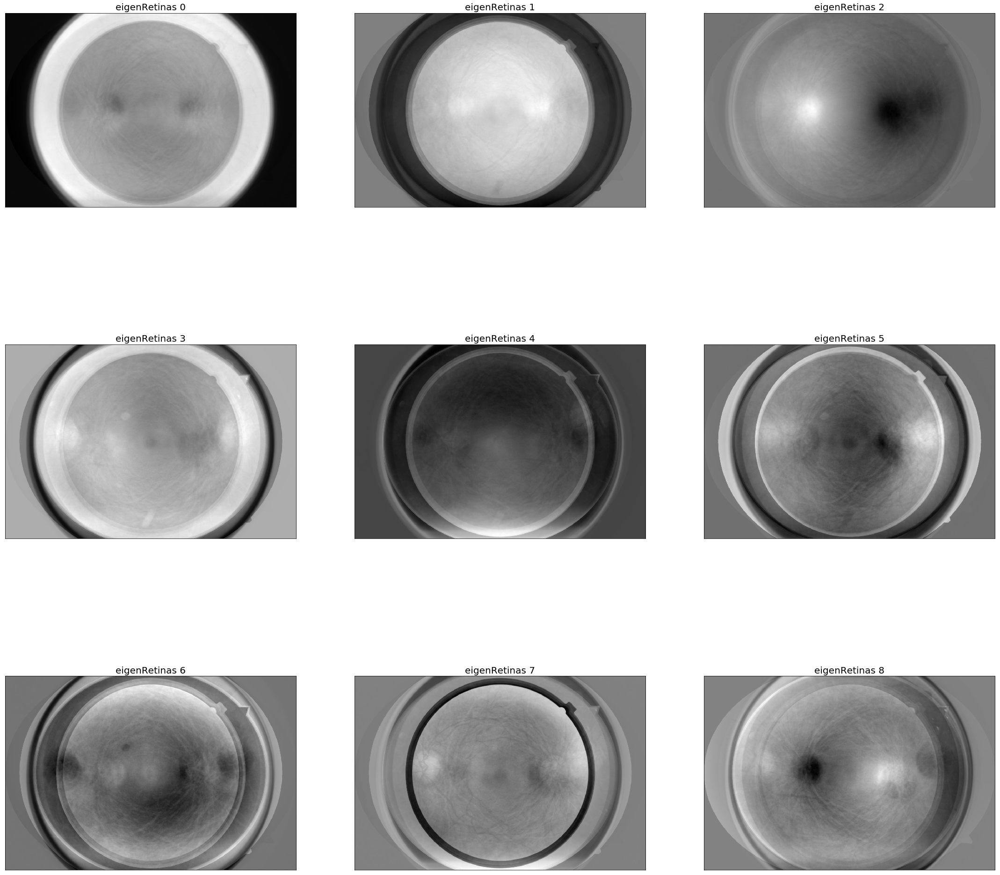

In [9]:
eigenRetinas_titles = ["eigenRetinas %d" % i for i in range(eigenRetinas.shape[0])]
eigen = np.array(eigen)

plot_gallery(eigen[:9], eigenRetinas_titles, h, w)


In [10]:
# manipulated from Sebastian Raschka Example (your book!)
# also from hi blog here: http://sebastianraschka.com/Articles/2015_pca_in_3_steps.html


def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Scatter, Marker, Layout, XAxis, YAxis, Bar, Line
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
        

pca = PCA(n_components)
X_pca = pca.fit(X)
plot_explained_variance(pca)

### 3.2 Non-Linear Dimensionality Reduction: Kernel PCA

Here we generate principal components for Kernel PCA.

In [11]:
%%time
# SKIP THIS BECAUSE IT TAKES A LONG TIME TO RUN
from sklearn.decomposition import KernelPCA

# n_components = 20
# print(np.sum(~np.isfinite(X)))
print ("Extracting the top %d eigenfaces from %d faces" % (n_components, X.shape[0]))

kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=True, gamma=15, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca.fit(X.copy())

Extracting the top 20 eigenfaces from 100 faces
Wall time: 1min 1s


In [12]:
import pickle

pickle.dump(kpca, open( 'kpca.p', 'wb' ))

In [13]:
kpca_loaded = pickle.load(open('kpca.p', 'rb' ))

Here we reconstruct the images using 3 different methods, namely Full PCA, Kernel PCA and Randomized PCA.

In [14]:
import warnings
warnings.simplefilter('ignore', DeprecationWarning)

from ipywidgets import widgets  # make this interactive!
# compare the different methods

def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    reconstructed_image = pca.inverse_transform(pca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca = kpca_loaded.inverse_transform(kpca_loaded.transform(X[idx_to_reconstruct].reshape(1, -1)))
    
    plt.figure(figsize=(25,20))
    
    plt.subplot(2,2,1)
    plt.imshow(X[idx_to_reconstruct].reshape((h, w)), cmap=plt.cm.gray)
    plt.title(names[y[idx_to_reconstruct]])
    plt.xticks(())
    plt.yticks(())
    plt.grid()
    
    plt.subplot(2,2,2)
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Full PCA')
    plt.xticks(())
    plt.yticks(())

    plt.grid()
    
    plt.subplot(2,2,3)
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Randomized PCA')
    plt.xticks(())
    plt.yticks(())
    plt.grid()
    
    plt.subplot(2,2,4)
    plt.imshow(reconstructed_image_kpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Kernel PCA')
    plt.xticks(())
    plt.yticks(())
    plt.grid()
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

A Jupyter Widget

<function __main__.plt_reconstruct>

### 3.3 Feature Extraction

#### 3.3.1 DAISY

Here we perform feature extraction on the images using the DAISY feature extraction technique.

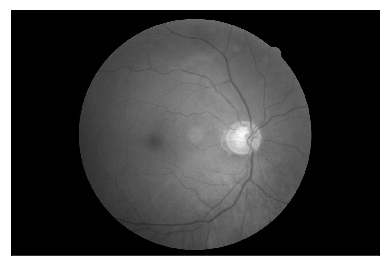

In [59]:
from skimage.io import imshow

idx_to_reconstruct = int(np.random.rand(1)*len(X))
img  = X[idx_to_reconstruct].reshape((h,w))
imshow(img)
plt.xticks(())
plt.yticks(())
plt.grid()

We first visualize how this feature extraction technique looks when it is applied on one of our images.

(78, 117, 72)
657072


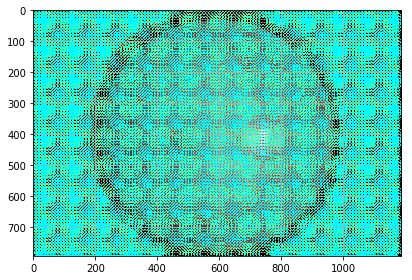

In [60]:
from skimage.feature import daisy

# lets first visualize what the daisy descripto looks like
features, img_desc = daisy(img,step=10, radius=10, rings=2, histograms=4, orientations=8, visualize=True)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])
imshow(img_desc)
plt.grid()

Now, we will apply this technique on our image data to extract features from the image.

In [61]:
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape),step=10, radius=10, rings=2, histograms=6, orientations=8, visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

Wall time: 1.81 s


(949104,)

In [62]:
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

Wall time: 3min 5s
(100, 949104)


In [63]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

Wall time: 477 ms


We find the closest image to the current one using the pairwise distance between all the image features.

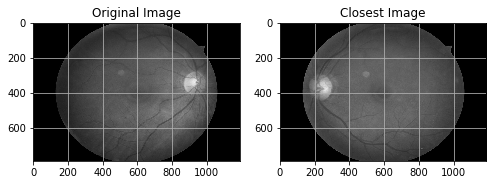

In [82]:
import copy
# find closest image to current image
idx1 = 53
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

In [83]:
from sklearn.metrics import mean_squared_error
mse_daisy = mean_squared_error(X[idx1], X[idx2])
print(mean_squared_error(X[idx1], X[idx2]))

54.0934279665


#### 3.3.2 Gabor filters

Here we use a second feature extraction technique known as Gabor filters.

In [66]:
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi
from scipy import stats

# prepare filter bank kernels
kernels = []
for theta in range(4):
    theta = theta / 4. * np.pi
    for sigma in (1, 3):
        for frequency in (0.05, 0.25):
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

            
# compute the filter bank and take statistics of image
def compute_gabor(row, kernels, shape):
    feats = np.zeros((len(kernels), 4), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(row.reshape(shape), kernel, mode='wrap')
        _,_,feats[k,0],feats[k,1],feats[k,2],feats[k,3] = stats.describe(filtered.reshape(-1))
        # mean, var, skew, kurt
        
    return feats.reshape(-1)

idx_to_reconstruct = int(np.random.rand(1)*len(X))

gabr_feature = compute_gabor(X[idx_to_reconstruct], kernels, (h,w))
gabr_feature

array([  1.22991995e+02,   6.14653108e+03,  -8.05473786e-01,
        -1.15047608e+00,   3.73320282e+01,   5.69652105e+02,
        -8.02144114e-01,  -1.15437012e+00,   8.28386559e+01,
         2.78445374e+03,  -8.06636663e-01,  -1.14802718e+00,
         1.08359479e-01,   2.73304877e+01,   4.87101545e+01,
         2.37079341e+03,   1.22993036e+02,   6.14653248e+03,
        -8.05463842e-01,  -1.15046330e+00,   3.73844410e+01,
         5.71028123e+02,  -8.01982839e-01,  -1.15401393e+00,
         8.35597973e+01,   2.83041875e+03,  -8.06338445e-01,
        -1.14710314e+00,   2.08156906e-01,   5.28243105e+01,
         3.50267145e+01,   1.22489068e+03,   1.22991827e+02,
         6.14629105e+03,  -8.05461861e-01,  -1.15044256e+00,
         3.73311237e+01,   5.69108798e+02,  -8.01851807e-01,
        -1.15356710e+00,   8.28384476e+01,   2.77926186e+03,
        -8.06149191e-01,  -1.14623826e+00,   1.57956884e-01,
         3.98256907e+01,   4.03417155e+01,   1.62553356e+03,
         1.22993172e+02,

In [67]:
%time gabor_stats = np.apply_along_axis(compute_gabor, 1, X, kernels, (h,w))
print(gabor_stats.shape)

Wall time: 6min 41s
(100, 64)


In [68]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix_gabor = pairwise_distances(gabor_stats)

Wall time: 2.01 ms


Gabor filter also gives us an image which is closest to the original image.

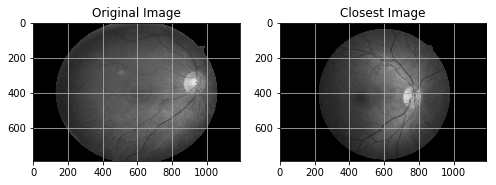

In [84]:
import copy
# find closest image to current image
idx1 = 53
distances = copy.deepcopy(dist_matrix_gabor[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

In [85]:
mse_gabor = mean_squared_error(X[idx1], X[idx2])
print(mean_squared_error(X[idx1], X[idx2]))

63.8699707513


### 3.4 Comparing feature extraction techniques


<center>
<table class="table table-striped">
   <thead>
      <tr>
         <th style="text-align:left">Technique</th>
         <th style="text-align:left">Mean-squared error (in percentage)</th>
         <th style="text-align:left">Execution Time</th>
      </tr>
   </thead>
   <tbody>
      <tr>
         <td style="text-align:left">DAISY</td>
         <td style="text-align:left">54.09</td>
         <td style="text-align:left">3 minutes 5 seconds</td>
      </tr>
      <tr>
         <td style="text-align:left">Gabor filters</td>
         <td style="text-align:left">63.86</td>
         <td style="text-align:left">6 minutes 41 seconds</td>
      </tr>
   </tbody>
</table>
</center>

Based on the above data, it is clear that DAISY is better than Gabor filter technique in terms of accuracy and speed. Hence, it is a better fit for our dataset.

## 4. Exceptional Work : Feature Extraction using SIFT

As an additional analysis, we implemented SIFT(Scale-invariant feature transform) algorithm to perform feature extraction.

In [99]:
import cv2

def get_rand_img_sift(idx_to_reconstruct):
#     idx_to_reconstruct = int(np.random.rand(1)*len(files))
    img = cv2.imread(files[idx_to_reconstruct])
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    sift = cv2.xfeatures2d.SIFT_create()
    kp = sift.detect(gray,None)

    img = cv2.drawKeypoints(gray,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

def gen_sift_features(gray_img):
    sift = cv2.xfeatures2d.SIFT_create()
    # kp is the keypoints
    #
    # desc is the SIFT descriptors, they're 128-dimensional vectors
    # that we can use for our final features
    kp, desc = sift.detectAndCompute(gray_img, None)
    return kp, desc

We first execute keypoint localization on one of our training image data selected randomly. 

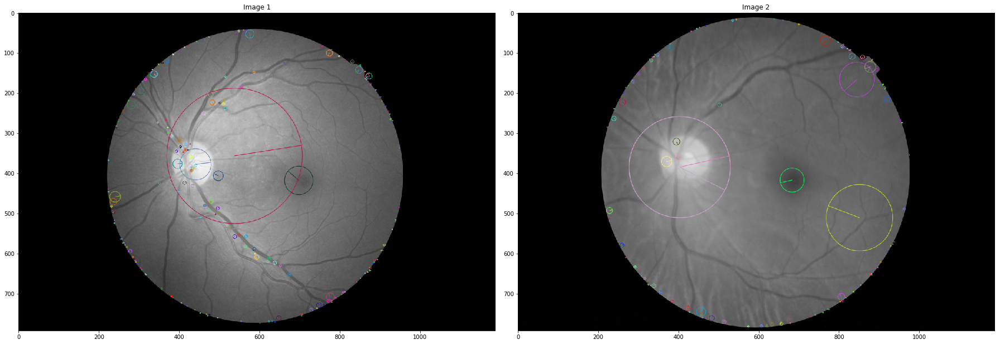

In [100]:
img1 = get_rand_img_sift(int(np.random.rand(1)*len(files)))
img2 = get_rand_img_sift(int(np.random.rand(1)*len(files)))
plt.figure(figsize=(25, 25))
plt.subplot(1,2,1)
plt.title("Image 1")
imshow(img1.reshape((h, w, 3)))
# plt.figure(figsize=(50, 50))
plt.subplot(1,2,2)
plt.title("Image 2")
imshow(img2.reshape((h, w, 3)))

img1_kp, img1_desc = gen_sift_features(img1)
img2_kp, img2_desc = gen_sift_features(img2)

As we can see, we have detected multiple keypoint candidates from the two images above using keypoint localization. 

The next step is to build a nearest neighbor classifier. Following that, we match pairs of images using the brute force matching technique to compare the features. The nearest neighbor is classified by the maximum number of matches found.

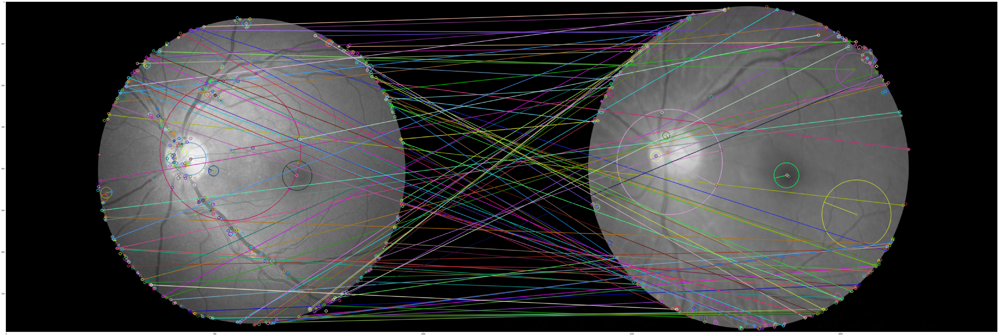

In [101]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

matches = bf.match(img1_desc, img2_desc)

# Sort the matches in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# draw the top N matches
N_MATCHES = 100

match_img = cv2.drawMatches(
    img1, img1_kp,
    img2, img2_kp,
    matches[:N_MATCHES], img2.copy(), flags=0)

plt.figure(figsize=(100,200))
plt.imshow(match_img);

In [110]:
from PIL import Image

im = Image.open("dest\\17533_left.jpeg")
im = im.convert(mode='L')
size = int(4752*0.25), int(3168*0.25)
im_resized = im.resize(size, Image.ANTIALIAS)
test_img = "dest3\\17533_left.jpeg"
im_resized.save(test_img, "JPEG")

In [111]:
img3 = cv2.imread(test_img)
gray = cv2.cvtColor(img3,cv2.COLOR_BGR2GRAY)

sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(gray,None)

img3 = cv2.drawKeypoints(gray,kp,img3,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img3_kp, img3_desc = gen_sift_features(img3)

In [114]:
bf = cv2.BFMatcher()
required_img = None
max_good = 0
for i in range(len(files)):
    img2 = get_rand_img_sift(i)
    img2_kp, img2_desc = gen_sift_features(img2)
    matches = bf.knnMatch(img2_desc,img3_desc, k=2)
    good = []
    for m,n in matches:
        if m.distance < 0.5*n.distance:
            good.append([m])
    if max_good < len(good):
        max_good = len(good)
        required_img = files[i]

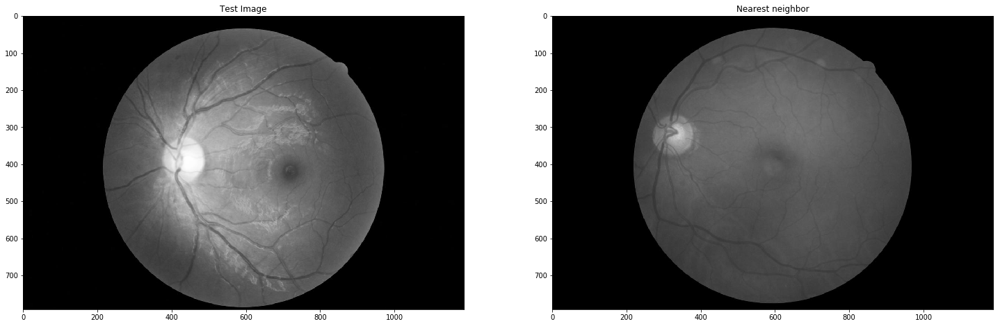

In [113]:
plt.figure(figsize=(25, 25))
plt.subplot(1,2,2)
plt.title("Nearest neighbor")
req = cv2.imread(required_img)
plt.imshow(req)

plt.subplot(1,2,1)
img = cv2.imread(test_img)
plt.title("Test Image")
plt.imshow(img)

It is quite evident from the above two images that our implemented algorithm is able to find the nearest match using the test image. Therefore, it works as expected!

## References

* https://www.kaggle.com/c/diabetic-retinopathy-detection/data
* https://en.wikipedia.org/wiki/Scale-invariant_feature_transform